In [3]:
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score
from sklearn.metrics import v_measure_score
from folium.plugins import HeatMap
import folium

In [4]:
uber=pd.read_csv(r'/Users/helmichaaba/Downloads/uber-raw-data-may14.csv')
uber

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512
...,...,...,...,...
652430,5/31/2014 23:45:00,40.7309,-74.0014,B02764
652431,5/31/2014 23:52:00,40.7528,-73.9798,B02764
652432,5/31/2014 23:55:00,40.7158,-73.9519,B02764
652433,5/31/2014 23:56:00,40.6961,-73.8997,B02764


In [5]:
uber.head()

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512


In [6]:
uber.tail()

,Date/Time,Lat,Lon,Base
652430,5/31/2014 23:45:00,40.7309,-74.0014,B02764
652431,5/31/2014 23:52:00,40.7528,-73.9798,B02764
652432,5/31/2014 23:55:00,40.7158,-73.9519,B02764
652433,5/31/2014 23:56:00,40.6961,-73.8997,B02764
652434,5/31/2014 23:59:00,40.7393,-73.9919,B02764


In [7]:
uber.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [8]:
uber.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [9]:
uber.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [18]:
uber['Date/Time']= pd.to_datetime(uber['Date/Time'],format = '%m/%d/%Y %H:%M:%S')

In [19]:
uber['weekday'] = uber['Date/Time'].dt.day_name()

In [20]:
uber['day'] = uber['Date/Time'].dt.day

In [21]:
uber['month'] = uber['Date/Time'].dt.month

In [22]:
uber['hour'] = uber['Date/Time'].dt.hour

In [23]:
uber['minute'] = uber['Date/Time'].dt.minute

In [24]:
uber.tail()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
652430,2014-05-31 23:45:00,40.7309,-74.0014,B02764,Saturday,31,45,5,23
652431,2014-05-31 23:52:00,40.7528,-73.9798,B02764,Saturday,31,52,5,23
652432,2014-05-31 23:55:00,40.7158,-73.9519,B02764,Saturday,31,55,5,23
652433,2014-05-31 23:56:00,40.6961,-73.8997,B02764,Saturday,31,56,5,23
652434,2014-05-31 23:59:00,40.7393,-73.9919,B02764,Saturday,31,59,5,23


In [48]:
uber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 652435 entries, 0 to 652434
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Date/Time   652435 non-null  datetime64[ns]
 1   Lat         652435 non-null  float64       
 2   Lon         652435 non-null  float64       
 3   Base        652435 non-null  object        
 4   weekday     652435 non-null  object        
 5   day         652435 non-null  int64         
 6   minute      652435 non-null  int64         
 7   month       652435 non-null  int64         
 8   hour        652435 non-null  int64         
 9   BinnedHour  652435 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(2), int64(4), object(2)
memory usage: 49.8+ MB


In [50]:
uber.describe()

,Lat,Lon,day,minute,month,hour
count,652435.000000,652435.000000,652435.000000,652435.000000,652435.0,652435.000000
mean,40.740072,-73.975004,15.795618,29.492569,5.0,14.482629
std,0.037537,0.054165,8.904397,17.365431,0.0,5.826876
min,40.106700,-74.929000,1.000000,0.000000,5.0,0.000000
25%,40.722400,-73.997000,8.000000,14.000000,5.0,10.000000
50%,40.743300,-73.983900,16.000000,30.000000,5.0,16.000000
75%,40.761400,-73.968100,23.000000,45.000000,5.0,19.000000
max,41.322500,-72.180100,31.000000,59.000000,5.0,23.000000


In [51]:
uber['weekday'].value_counts()


Friday       133991
Thursday     128921
Saturday     102990
Wednesday     89857
Tuesday       76662
Monday        63846
Sunday        56168
Name: weekday, dtype: int64

Text(0.5, 1.0, 'Frequency of use by day')

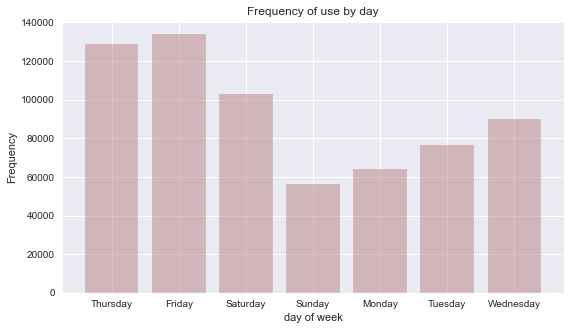

In [60]:
plt.hist(uber.weekday, bins = 7, range= (-.5, 6.5), rwidth = .8, color = '#AA6666', alpha= .4)
xticks=(range(7), 'Mon, Tue, Wed, Fri, Sat, Sun'.split())
plt.xlabel('day of week')
plt.ylabel('Frequency')
plt.title('Frequency of use by day')

[Text(0.5, 1.0, 'Frequency by DoM - uber - May'),
 Text(0.5, 0, 'date of the month'),
 Text(0, 0.5, 'Frequency')]

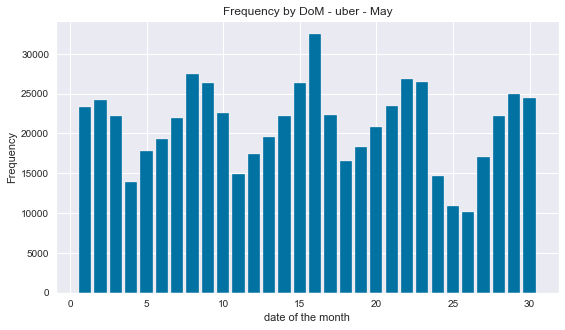

In [58]:
x = uber.day
plt.hist(x, bins=30, rwidth = .8, range = (0.5, 30.5))
plt.gca().set(title='Frequency by DoM - uber - May',xlabel='date of the month' ,ylabel='Frequency')

Text(0, 0.5, 'Frequency')

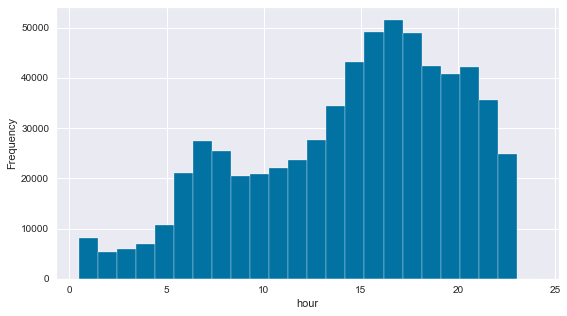

In [59]:
plt.hist(uber.hour, bins = 24, range = (.5, 24))
plt.xlabel('hour')
plt.ylabel('Frequency')

<AxesSubplot:xlabel='hour', ylabel='weekday'>

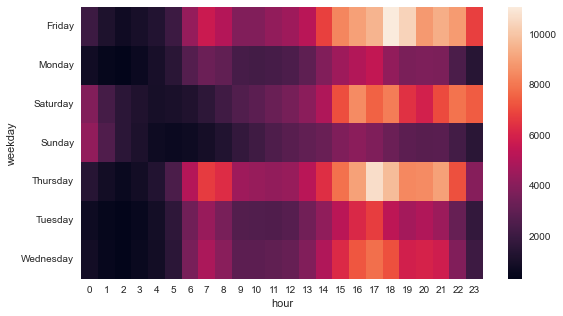

In [63]:
df = uber.groupby(["weekday", "hour"]).apply(lambda x: len(x))
df = df.unstack()
sns.heatmap(df, annot=False)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


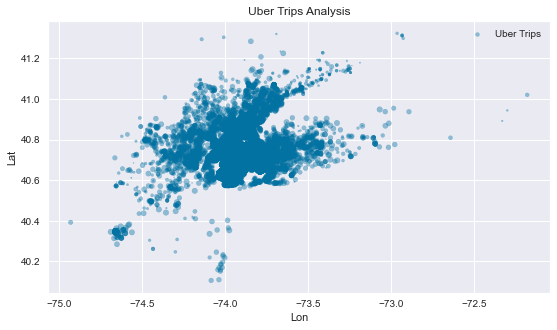

In [62]:
uber.plot(kind='scatter', x='Lon', y='Lat', alpha=0.4, s=uber['day'], label='Uber Trips',
cmap=plt.get_cmap('jet'))
plt.title("Uber Trips Analysis")
plt.legend()
plt.show()

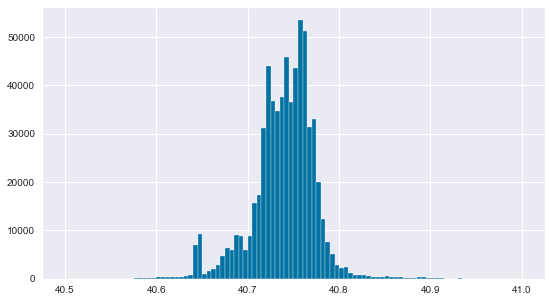

In [64]:
plt.hist(uber['Lat'], bins = 100, range = (40.5, 41));


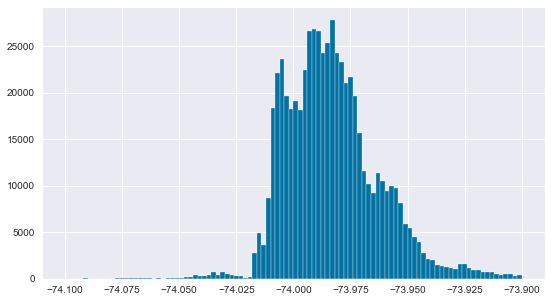

In [65]:
plt.hist(uber['Lon'], bins = 100, range = (-74.1, -73.9));

In [74]:
uber_out = uber[uber['weekday']=='Sunday']

In [75]:
uber_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour,BinnedHour
4122,2014-05-04 00:00:00,40.7340,-73.9986,B02512,Sunday,4,0,5,0,2014-05-04
4123,2014-05-04 00:01:00,40.7266,-73.9916,B02512,Sunday,4,1,5,0,2014-05-04
4124,2014-05-04 00:03:00,40.7740,-73.9633,B02512,Sunday,4,3,5,0,2014-05-04
4125,2014-05-04 00:03:00,40.7698,-73.9923,B02512,Sunday,4,3,5,0,2014-05-04
4126,2014-05-04 00:03:00,40.7142,-73.9896,B02512,Sunday,4,3,5,0,2014-05-04


In [77]:
rush = uber_out.groupby(['Lat','Lon'])['weekday'].count().reset_index()
rush.columns=['Lat','Lon','No. of Trips']

In [78]:
rush

,Lat,Lon,No. of Trips
0,40.1593,-74.0266,1
1,40.2187,-74.0009,1
2,40.2460,-74.0515,1
3,40.3176,-74.6599,1
4,40.3498,-74.6610,1
...,...,...,...
40044,41.1666,-73.7785,1
40045,41.1924,-73.4444,1
40046,41.3031,-74.0073,1
40047,41.3126,-72.9330,2


In [131]:
basemap = folium.Map()

In [132]:
HeatMap(rush,zoom=20,radius=10).add_to(basemap)
basemap

In [86]:
x = uber.iloc[:,1:3]
x

,Lat,Lon
0,40.7521,-73.9914
1,40.6965,-73.9715
2,40.7464,-73.9838
3,40.7463,-74.0011
4,40.7594,-73.9734
...,...,...
652430,40.7309,-74.0014
652431,40.7528,-73.9798
652432,40.7158,-73.9519
652433,40.6961,-73.8997


In [87]:
data_sample=x.sample(int(x.shape[0]*0.01))
data_sample.shape

(6524, 2)

In [88]:
#K_MEANS

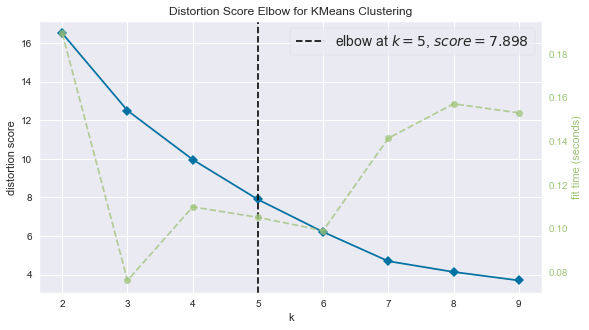

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [89]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
model = KMeans()
visualizer = KElbowVisualizer(estimator = model, k = (2,10))
visualizer.fit(data_sample)
visualizer.poof()

In [90]:
kmeans = KMeans(5)
y_kmeans=kmeans.fit_predict(data_sample)
y_kmeans

array([4, 4, 0, ..., 0, 0, 4], dtype=int32)

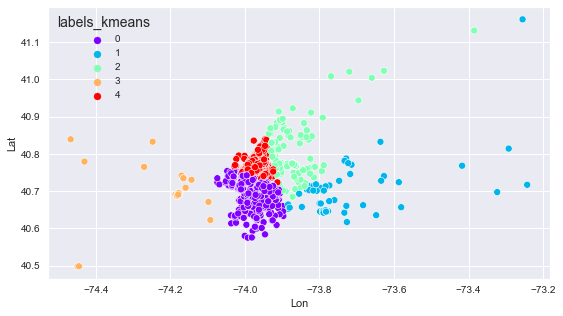

In [91]:
data_sample['labels_kmeans'] = kmeans.labels_
sns.set_style('darkgrid')
sns.scatterplot(data=data_sample, x='Lon', y='Lat', hue='labels_kmeans', palette='rainbow')
plt.show()

In [97]:
data_map_list_cluster1 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==0].values.tolist()
data_map_list_cluster2 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==1].values.tolist()
data_map_list_cluster3 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==2].values.tolist()
data_map_list_cluster4 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==3].values.tolist()
data_map_list_cluster5 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==4].values.tolist()

size_map_list_1 = len(data_map_list_cluster1)
size_map_list_2 = len(data_map_list_cluster2)
size_map_list_3 = len(data_map_list_cluster3)
size_map_list_4 = len(data_map_list_cluster4)
size_map_list_5 = len(data_map_list_cluster5)


In [114]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=7.5,tiles = "openstreetmap")
for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
m_p

In [ ]:
#DBSCAN

In [138]:
from sklearn.cluster import DBSCAN

cluster = DBSCAN(eps=0.5)
model = cluster.fit(data_sample)

In [100]:
# Your code here
data_sample['labels_DBSCAN']=model.labels_
data_sample.labels_DBSCAN.value_counts()

2    2332
1    2206
4     802
6     378
0     367
5     193
3     178
7      60
8       8
Name: labels_DBSCAN, dtype: int64

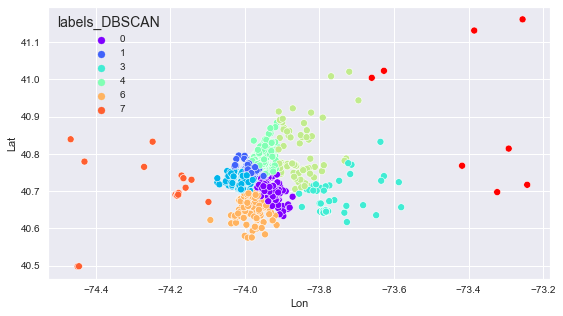

In [101]:
data_sample['labels_DBSCAN'] = model.labels_
sns.set_style('darkgrid')
sns.scatterplot(data=data_sample, x='Lon', y='Lat', hue='labels_DBSCAN', palette='rainbow')
plt.show()

In [102]:
data_map_list_cluster1 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==0].values.tolist()
data_map_list_cluster2 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==1].values.tolist()
data_map_list_cluster3 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==3].values.tolist()
data_map_list_cluster4 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==4].values.tolist()
data_map_list_cluster5 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==6].values.tolist()
data_map_list_cluster6 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==7].values.tolist()
size_map_list_1 = len(data_map_list_cluster1)
size_map_list_2 = len(data_map_list_cluster2)
size_map_list_3 = len(data_map_list_cluster3)
size_map_list_4 = len(data_map_list_cluster4)
size_map_list_5 = len(data_map_list_cluster5)
size_map_list_6 = len(data_map_list_cluster6)

In [112]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=7.5,tiles = "openstreetmap")
for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
for point in range(0,size_map_list_6):
    folium.CircleMarker(data_map_list_cluster6[point], radius=2,color='violet',fill_color='violet',).add_to(m_p)
m_p

In [ ]:
#SpectralClustering

In [106]:
clustering = SpectralClustering(n_clusters=5,assign_labels='discretize',random_state=0)
cluster1=clustering.fit(data_sample)

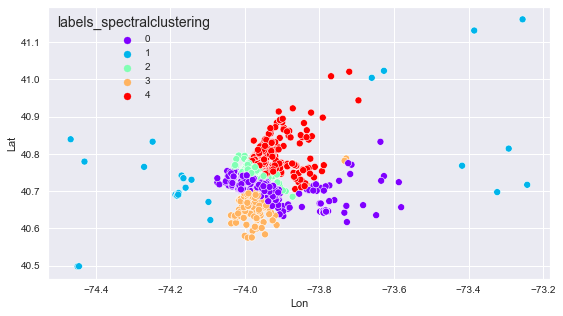

In [ ]:
data_sample['labels_spectralclustering'] = clustering.labels_
sns.set_style('darkgrid')
sns.scatterplot(data=data_sample, x='Lon', y='Lat', hue='labels_spectralclustering', palette='rainbow')
plt.show()

In [108]:
data_map_list_cluster1 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==0].values.tolist()
data_map_list_cluster2 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==1].values.tolist()
data_map_list_cluster3 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==2].values.tolist()
data_map_list_cluster4 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==3].values.tolist()
data_map_list_cluster5 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==4].values.tolist()

size_map_list_1 = len(data_map_list_cluster1)
size_map_list_2 = len(data_map_list_cluster2)
size_map_list_3 = len(data_map_list_cluster3)
size_map_list_4 = len(data_map_list_cluster4)
size_map_list_5 = len(data_map_list_cluster5)


In [113]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=7.5,tiles = "openstreetmap")
for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
m_p